# 1972 Network

In [1]:
import pandas as pd
%pip install networkx
import networkx as nx
import matplotlib.pyplot as plt

df72 = pd.read_csv('../data/IEA_EDGAR_CO2_1970-2021_byyear.csv')

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


In [2]:
df72.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4773 entries, 0 to 4772
Data columns (total 60 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   IPCC_annex                               4773 non-null   object 
 1   C_group_IM24_sh                          4773 non-null   object 
 2   Country_code_A3                          4773 non-null   object 
 3   Name                                     4773 non-null   object 
 4   ipcc_code_2006_for_standard_report       4773 non-null   object 
 5   ipcc_code_2006_for_standard_report_name  4773 non-null   object 
 6   Substance                                4773 non-null   object 
 7   fossil_bio                               4773 non-null   object 
 8   Y_1970                                   3484 non-null   float64
 9   Y_1971                                   3489 non-null   float64
 10  Y_1972                                   3495 no

In [3]:
# Selezioniamo solo le colonne di interesse
df72_network = df72[["Country_code_A3","Name", "ipcc_code_2006_for_standard_report","ipcc_code_2006_for_standard_report_name", "Y_1972"]]
df72_network.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4773 entries, 0 to 4772
Data columns (total 5 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Country_code_A3                          4773 non-null   object 
 1   Name                                     4773 non-null   object 
 2   ipcc_code_2006_for_standard_report       4773 non-null   object 
 3   ipcc_code_2006_for_standard_report_name  4773 non-null   object 
 4   Y_1972                                   3495 non-null   float64
dtypes: float64(1), object(4)
memory usage: 186.6+ KB


In [4]:
df72noNa=df72_network.dropna()
df72noNa

,Country_code_A3,Name,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_name,Y_1972
0,ABW,Aruba,1.A.1.a,Main Activity Electricity and Heat Production,0.021451
1,ABW,Aruba,1.A.2,Manufacturing Industries and Construction,9.504931
2,ABW,Aruba,1.A.4,Residential and other sectors,0.848604
3,ABW,Aruba,1.A.5,Non-Specified,0.057359
5,ABW,Aruba,1.A.1.a,Main Activity Electricity and Heat Production,34.176170
...,...,...,...,...,...
4766,ZWE,Zimbabwe,2.A.1,Cement production,305.488000
4767,ZWE,Zimbabwe,2.A.3,Glass Production,0.278666
4769,ZWE,Zimbabwe,2.B,Chemical Industry,148.155000
4770,ZWE,Zimbabwe,2.C,Metal Industry,1204.285510


In [5]:
df72noNa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3495 entries, 0 to 4771
Data columns (total 5 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Country_code_A3                          3495 non-null   object 
 1   Name                                     3495 non-null   object 
 2   ipcc_code_2006_for_standard_report       3495 non-null   object 
 3   ipcc_code_2006_for_standard_report_name  3495 non-null   object 
 4   Y_1972                                   3495 non-null   float64
dtypes: float64(1), object(4)
memory usage: 163.8+ KB


# Creating and visualizing the Network

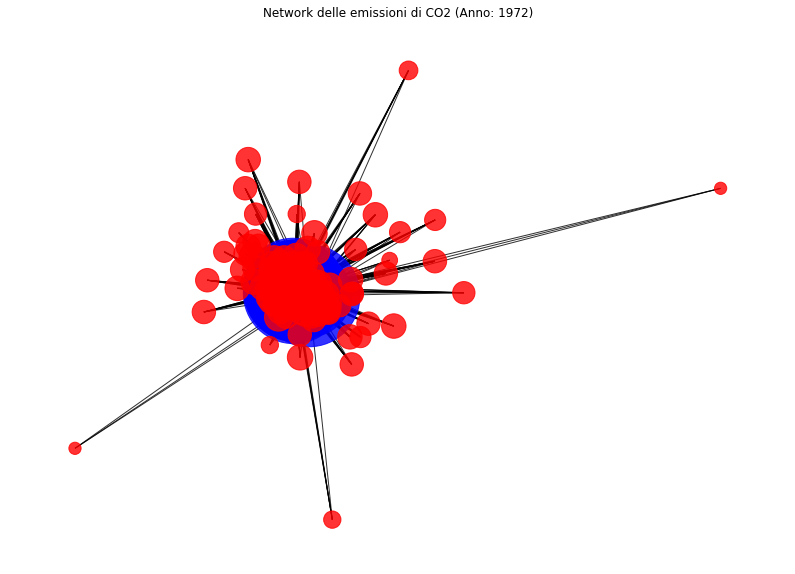

In [6]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms import bipartite


# Selezioniamo solo le colonne di interesse
df72_network = df72[["Country_code_A3","Name", "ipcc_code_2006_for_standard_report","ipcc_code_2006_for_standard_report_name", "Y_1972"]]

# Rimuoviamo le righe con valori mancanti nella colonna "Y_1972"
df72_network = df72_network.dropna(subset=["Y_1972"])

# Creiamo un grafo indiretto (non diretto)
G = nx.Graph()

# Aggiungiamo i nodi al grafo
for _, row in df72_network.iterrows():
  if row["Y_1972"]:
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    G.add_node(country_code, label=country_code, color="red", bipartite=0, part='accountCountries',name=row["Name"])  # Nodi dal "C_group_IM24_sh" saranno rossi
    G.add_node(ipcc_code, label=ipcc_code, color="blue", bipartite=1, part='accountIndustries', industry_name=row['ipcc_code_2006_for_standard_report_name'])        # Nodi non dal "C_group_IM24_sh" saranno blu

# Aggiungiamo gli archi al grafo con i pesi basati su "Y_1972"
for _, row in df72_network.iterrows():
   if row["Y_1972"]:
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    weight = row["Y_1972"]
    # Se esiste già un arco tra i due nodi, aggiorna il peso
    #if G.has_edge(country_code, ipcc_code):
        #G[country_code][ipcc_code]['weight'] += weight
    #else:
    
    G.add_edge(country_code, ipcc_code, weight=weight)

# Posizionamento dei nodi nel plot del grafo
pos = nx.spring_layout(G, seed=42)

# Dimensione dei nodi proporzionale al grado
node_size = [v * 50 for v in dict(G.degree()).values()]

# Colori dei nodi
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Etichette dei nodi
node_labels = nx.get_node_attributes(G, "label")

# Peso degli archi
edge_weights = nx.get_edge_attributes(G, "weight")

# Creazione del plot del grafo
plt.figure(figsize=(14, 10))
nx.draw_networkx(G, pos, node_size=node_size, node_color=node_colors, with_labels=False, alpha=0.8)
#nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight="bold")
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_weights, font_size=8, font_color="red")

# Titolo del plot
plt.title("Network delle emissioni di CO2 (Anno: 1972)")

# Mostrare il plot del grafo
plt.axis("off")
plt.show()


In [50]:
nx.write_gexf(G, "CO2_emissions_bipartite_1972.gexf")

In [94]:
#nx.write_gexf(DiG, "CO2_emissions_directed_bipartite.gexf")

# Getting basic info

In [125]:
#undirected graph
type(G)

networkx.classes.graph.Graph

In [126]:
bipartite.is_bipartite(G)

True

In [7]:
print(G)

Graph with 234 nodes and 3103 edges


less edges

In [129]:
#metadata - bipartite info
list(G.nodes(data=True))[0:5]

[('ABW',
  {'label': 'ABW',
   'color': 'red',
   'bipartite': 0,
   'part': 'accountCountries',
   'name': 'Aruba'}),
 ('1.A.1.a',
  {'label': '1.A.1.a',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries',
   'industry_name': 'Main Activity Electricity and Heat Production'}),
 ('1.A.2',
  {'label': '1.A.2',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries',
   'industry_name': 'Manufacturing Industries and Construction'}),
 ('1.A.4',
  {'label': '1.A.4',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries',
   'industry_name': 'Residential and other sectors'}),
 ('1.A.5',
  {'label': '1.A.5',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries',
   'industry_name': 'Non-Specified'})]

# Generating different visualizations

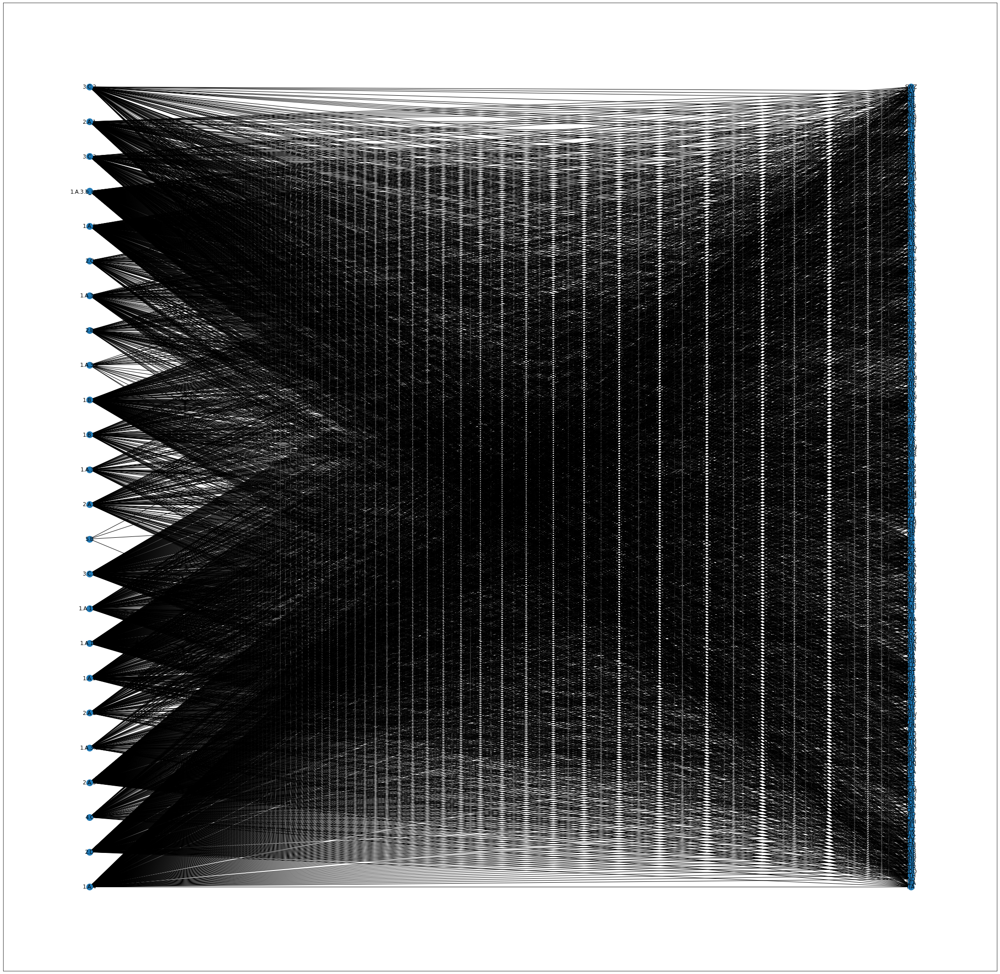

In [9]:
import networkx as nx
import matplotlib.pyplot as plt

bottom_nodes, top_nodes = bipartite.sets(G)

pos = nx.bipartite_layout(G, top_nodes)
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=True, node_size=node_size)

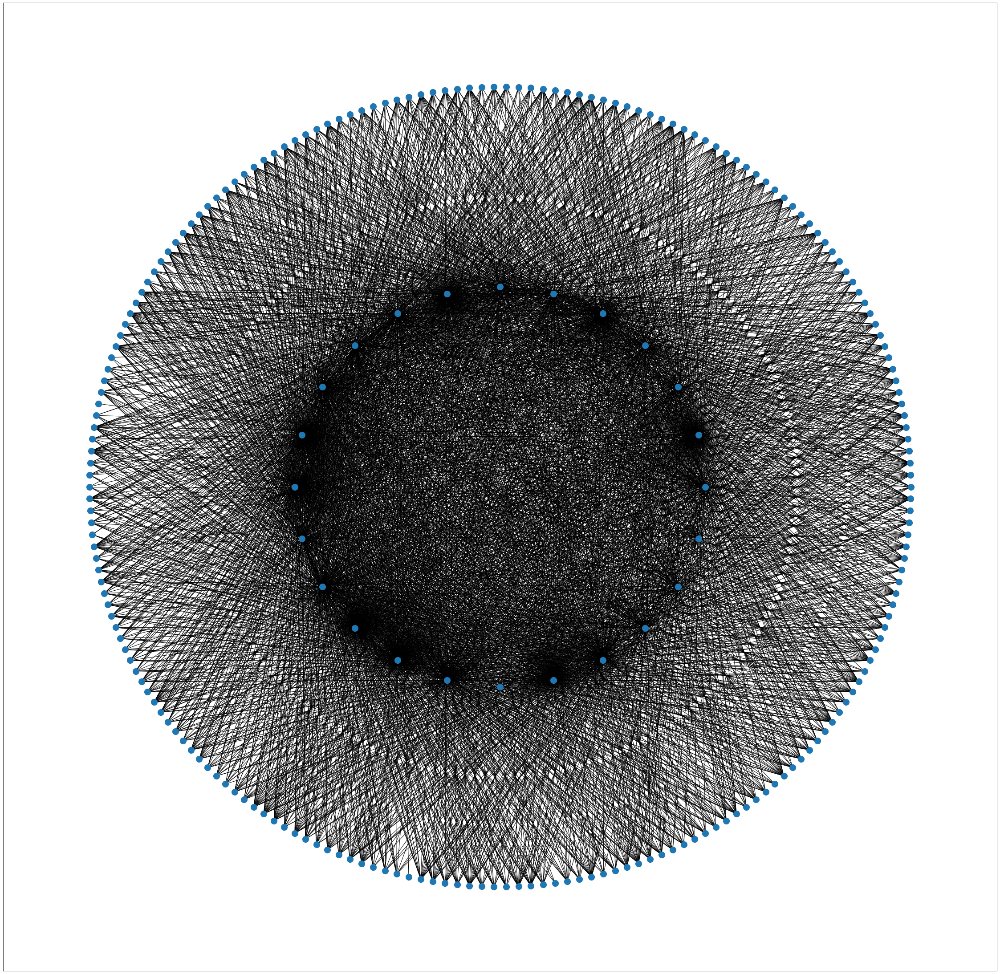

In [131]:
pos = nx.shell_layout(G, [top_nodes,bottom_nodes])
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=False, node_size=node_size)

In [10]:
bottom_nodes, top_nodes = bipartite.sets(G)

print(round(bipartite.density(G, bottom_nodes), 2))

0.62


In [11]:

bipartite.density(G, list(top_nodes))

0.6156746031746032

In [58]:
nx.bipartite.maximum_matching(G)
#use it to compare??

{'GNQ': '1.A.4',
 'CUB': '1.A.1.a',
 'MAC': '1.A.2',
 'LBR': '3.C.1',
 'GIB': '1.A.3.b_noRES',
 'DEU': '1.A.1.bc',
 'VGB': '1.A.5',
 'UZB': '1.A.3.a',
 'IDN': '1.A.3.c',
 'GMB': '1.B.2',
 'BWA': '1.B.1',
 'MOZ': '2.A.1',
 'STP': '2.A.3',
 'SLE': '2.D',
 'BFA': '2.A.4',
 'GLP': '2.A.2',
 'LAO': '1.A.3.d',
 'BRA': '2.B',
 'PRY': '3.C.3',
 'MLI': '4.C',
 'CRI': '1.A.3.e',
 'SCG': '2.C',
 'NPL': '3.C.2',
 'AUS': '5.B',
 '2.A.2': 'GLP',
 '1.A.3.b_noRES': 'GIB',
 '1.A.3.a': 'UZB',
 '4.C': 'MLI',
 '1.A.1.bc': 'DEU',
 '2.D': 'SLE',
 '3.C.1': 'LBR',
 '2.A.4': 'BFA',
 '3.C.3': 'PRY',
 '2.A.3': 'STP',
 '1.A.1.a': 'CUB',
 '2.A.1': 'MOZ',
 '5.B': 'AUS',
 '1.A.4': 'GNQ',
 '1.A.5': 'VGB',
 '1.B.1': 'BWA',
 '1.A.3.c': 'IDN',
 '1.A.3.e': 'CRI',
 '1.A.3.d': 'LAO',
 '1.A.2': 'MAC',
 '2.B': 'BRA',
 '3.C.2': 'NPL',
 '1.B.2': 'GMB',
 '2.C': 'SCG'}

In [39]:
weight_proj = bipartite.weighted_projected_graph(G, list(bottom_nodes), ratio=True)
list(weight_proj.edges(data=True))


[('GNQ', 'CUB', {'weight': 0.25}),
 ('GNQ', 'MAC', {'weight': 0.20833333333333334}),
 ('GNQ', 'LBR', {'weight': 0.25}),
 ('GNQ', 'GIB', {'weight': 0.20833333333333334}),
 ('GNQ', 'DEU', {'weight': 0.25}),
 ('GNQ', 'VGB', {'weight': 0.20833333333333334}),
 ('GNQ', 'UZB', {'weight': 0.20833333333333334}),
 ('GNQ', 'IDN', {'weight': 0.25}),
 ('GNQ', 'GMB', {'weight': 0.25}),
 ('GNQ', 'BWA', {'weight': 0.25}),
 ('GNQ', 'MOZ', {'weight': 0.25}),
 ('GNQ', 'STP', {'weight': 0.25}),
 ('GNQ', 'SLE', {'weight': 0.25}),
 ('GNQ', 'CYM', {'weight': 0.20833333333333334}),
 ('GNQ', 'BFA', {'weight': 0.25}),
 ('GNQ', 'DJI', {'weight': 0.20833333333333334}),
 ('GNQ', 'GLP', {'weight': 0.25}),
 ('GNQ', 'LAO', {'weight': 0.25}),
 ('GNQ', 'BRA', {'weight': 0.25}),
 ('GNQ', 'PRY', {'weight': 0.25}),
 ('GNQ', 'MLI', {'weight': 0.25}),
 ('GNQ', 'CRI', {'weight': 0.25}),
 ('GNQ', 'QAT', {'weight': 0.25}),
 ('GNQ', 'SCG', {'weight': 0.25}),
 ('GNQ', 'BHS', {'weight': 0.25}),
 ('GNQ', 'BRN', {'weight': 0.25}),


In [40]:
weight_proj = bipartite.collaboration_weighted_projected_graph(G, list(bottom_nodes))
list(weight_proj.edges(data=True))


[('GNQ', 'CUB', {'weight': 0.02985122507659308}),
 ('GNQ', 'MAC', {'weight': 0.02456021978558779}),
 ('GNQ', 'LBR', {'weight': 0.02985122507659308}),
 ('GNQ', 'GIB', {'weight': 0.02456021978558779}),
 ('GNQ', 'DEU', {'weight': 0.02985122507659308}),
 ('GNQ', 'VGB', {'weight': 0.02456021978558779}),
 ('GNQ', 'UZB', {'weight': 0.024876100698483627}),
 ('GNQ', 'IDN', {'weight': 0.02985122507659308}),
 ('GNQ', 'GMB', {'weight': 0.02985122507659308}),
 ('GNQ', 'BWA', {'weight': 0.02985122507659308}),
 ('GNQ', 'MOZ', {'weight': 0.02985122507659308}),
 ('GNQ', 'STP', {'weight': 0.02985122507659308}),
 ('GNQ', 'SLE', {'weight': 0.02985122507659308}),
 ('GNQ', 'CYM', {'weight': 0.02456021978558779}),
 ('GNQ', 'BFA', {'weight': 0.02985122507659308}),
 ('GNQ', 'DJI', {'weight': 0.02456021978558779}),
 ('GNQ', 'GLP', {'weight': 0.02985122507659308}),
 ('GNQ', 'LAO', {'weight': 0.02985122507659308}),
 ('GNQ', 'BRA', {'weight': 0.02985122507659308}),
 ('GNQ', 'PRY', {'weight': 0.02985122507659308}),

In [14]:
weight_proj_coll = bipartite.collaboration_weighted_projected_graph(G, list(bottom_nodes))
list(weight_proj_coll.edges(data=True))

[('ITA', 'SEA', {'weight': 0.012658227848101266}),
 ('ITA', 'IND', {'weight': 0.17235014978702357}),
 ('ITA', 'ETH', {'weight': 0.12969438236434136}),
 ('ITA', 'SUR', {'weight': 0.09216162471118253}),
 ('ITA', 'COD', {'weight': 0.11317790560814577}),
 ('ITA', 'KOR', {'weight': 0.2150488081977563}),
 ('ITA', 'BHR', {'weight': 0.06717483292818004}),
 ('ITA', 'TUR', {'weight': 0.17520962691120656}),
 ('ITA', 'GNB', {'weight': 0.08083660777766766}),
 ('ITA', 'MAR', {'weight': 0.1349701981315488}),
 ('ITA', 'YEM', {'weight': 0.07379125690956194}),
 ('ITA', 'FLK', {'weight': 0.060830522859395594}),
 ('ITA', 'KAZ', {'weight': 0.16530789626589681}),
 ('ITA', 'LUX', {'weight': 0.09635417524311557}),
 ('ITA', 'BLZ', {'weight': 0.07297524471828482}),
 ('ITA', 'MLI', {'weight': 0.08050000681459384}),
 ('ITA', 'MWI', {'weight': 0.08763932886610303}),
 ('ITA', 'CIV', {'weight': 0.09006480773080394}),
 ('ITA', 'FRO', {'weight': 0.019925844734028877}),
 ('ITA', 'DJI', {'weight': 0.058602358866525706})

In [19]:
c = bipartite.clustering(G, nodes=list(bottom_nodes))
c

{'GNQ': 0.4132295810336333,
 'CUB': 0.6437113325271219,
 'MAC': 0.5354620573473319,
 'LBR': 0.6277495775038376,
 'GIB': 0.37097111284105644,
 'DEU': 0.6562911725955206,
 'VGB': 0.5339872364266433,
 'UZB': 0.5547253179691306,
 'IDN': 0.6316360205220197,
 'GMB': 0.6311919621293309,
 'BWA': 0.5168536274439707,
 'MOZ': 0.6367720065001676,
 'STP': 0.6051794472652066,
 'SLE': 0.6311919621293309,
 'CYM': 0.5339872364266433,
 'BFA': 0.6311919621293309,
 'DJI': 0.553630517722908,
 'GLP': 0.6382840668972297,
 'LAO': 0.6101922415398845,
 'BRA': 0.6333855884771216,
 'PRY': 0.6117707097347701,
 'MLI': 0.6313118808574428,
 'CRI': 0.5979304347331574,
 'QAT': 0.5295680672370828,
 'SCG': 0.6415800676769734,
 'BHS': 0.6424070775341976,
 'BRN': 0.5952958625519736,
 'CAF': 0.6311919621293309,
 'NPL': 0.5207784019790579,
 'PRK': 0.616918634267972,
 'CIV': 0.5882292913705756,
 'POL': 0.6474720931242669,
 'TWN': 0.6474720931242669,
 'SWE': 0.6562911725955206,
 'DMA': 0.6168839001478857,
 'COL': 0.63915862217

ASSORTATIVITY

In [12]:
r = nx.degree_assortativity_coefficient(G, weight='weight')
r

-0.1836188573623558

The assortativity coefficient of a graph ranges between 
−1 and 1, just like a correlation coefficient. Assortativity coefficients close to 1 indicate that there is very high likelihood of two vertices with the same property being connected. This is called an assortative network. Assortativity coefficients close to −1 indicate that there is very low likelihood of two vertices with the same property being connected. This is called a disassortative network. Networks with assortativity coefficients close to zero are neither assortative nor disassortative and are usually described as having neutral assortativity.

negative values means that large-degree nodes tend to attach to low- degree nodes

# Simrank

In [111]:
sr72= nx.simrank_similarity(G)
sr72Data = pd.DataFrame(data=sr72)
sr72Data.head()

,ABW,1.A.1.a,1.A.2,1.A.4,1.A.5,1.A.3.a,1.A.3.b_noRES,1.B.2,2.A.3,2.D,...,VCT,VEN,VGB,VNM,VUT,WSM,YEM,ZAF,ZMB,ZWE
ABW,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.631789,0.466722,0.659908,0.516384,0.560445,0.579537,0.475265,0.509366,0.45487,0.462768
1.A.1.a,0.0,1.000000,0.527311,0.538629,0.496062,0.490577,0.547651,0.396505,0.528112,0.553984,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
1.A.2,0.0,0.527311,1.000000,0.528911,0.489548,0.480389,0.535248,0.393690,0.519707,0.536978,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
1.A.4,0.0,0.538629,0.528911,1.000000,0.491322,0.494922,0.551960,0.395814,0.528146,0.553974,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
1.A.5,0.0,0.496062,0.489548,0.491322,1.000000,0.443178,0.489119,0.387725,0.489929,0.494864,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000


In [ ]:
for key in sr72: 
    for innerkey in sr72[key]:
        if sr72[key][innerkey] == 0:
            

#Measures
-  Load Centrality
-  degree centrality
- betweeness centrality
- eigenvector
explain why not betweeness
- laplacian
-  birank(pagerank)
- simrank

# Applying Centrality Measures

## Load Centrality

['1.B.2', 'FLK', '2.A.3', '4.C', 'LAO']

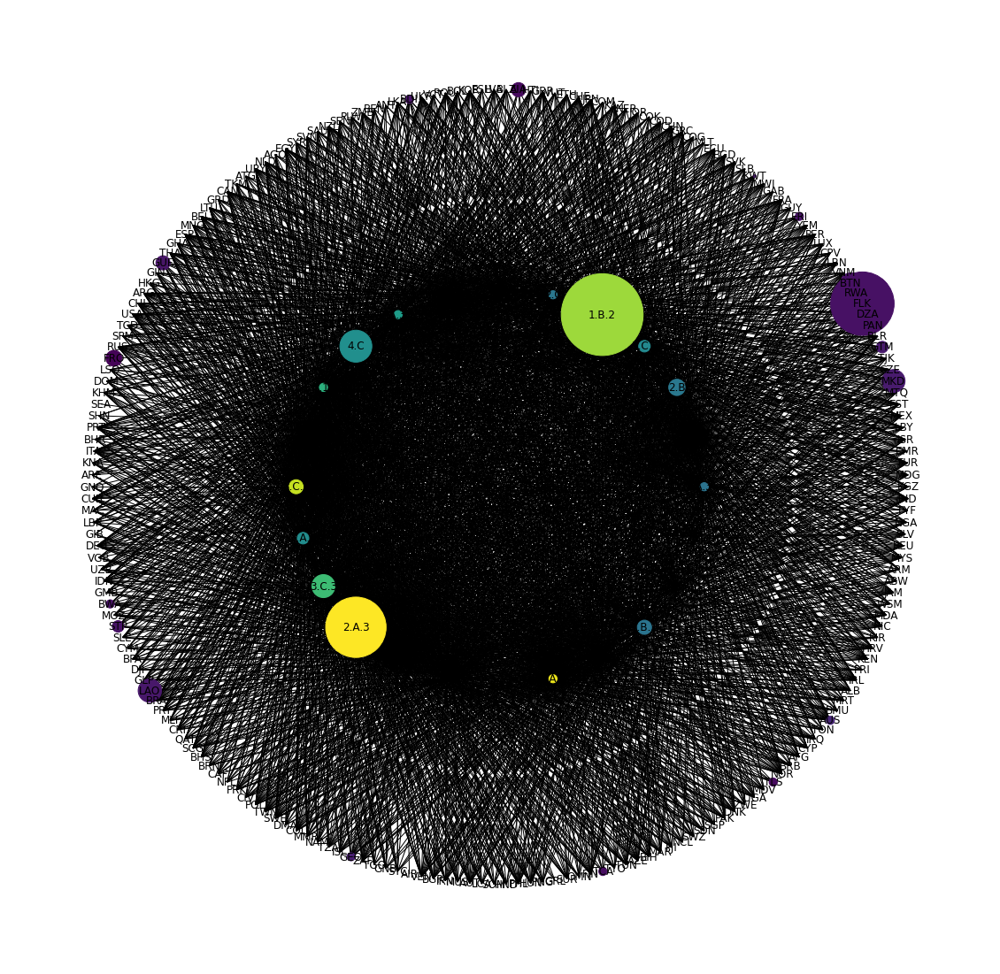

In [60]:
from networkx import load_centrality
LoadCentr=load_centrality(G, v=None, cutoff=None, normalized=True, weight='weight')
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LoadCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=True,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LoadCentr, key=LoadCentr.get, reverse=True)[:5]

In [61]:
load_series=pd.Series(LoadCentr)
LoadCentrNx=load_series.to_frame(name="nx_load_centr")
LoadCentrNx.sort_values(by="nx_load_centr", ascending=False)

,nx_load_centr
1.B.2,0.855594
FLK,0.513653
2.A.3,0.465924
4.C,0.130494
LAO,0.069927
...,...
GIB,0.000000
GIN,0.000000
GLP,0.000000
GMB,0.000000


In [71]:
LoadCentrNx.to_csv('../1972_csv/loadCentr1972.csv')

## Laplacian centrality
reference [article](https://www.sciencedirect.com/science/article/pii/S0020025511006761) <br>
" The Laplacian energy is defined as 
<br><br>
 ![Laplacian](../img/laplacianFormula.png) <br><br>
  where λi’s are eigenvalues of the Laplacian matrix of weighted network G. The importance (centrality) of a vertex v isreflected by the drop of the Laplacian energy of the network to respond to the deactivation (deletion) of the vertex from the network "

" Laplacian centrality unveils more structural information about connectivity and density around v (further than its immediate neighborhood). That is, comparing with other standard centrality measures proposed for weighted networks (e.g. degree, closeness or betweenness centrality), Laplacian centrality is an intermediate measuring between global and local characterization of the importance (centrality) of a vertex. "

"The centrality of some vertex v is characterized as a function in terms of the numbers of 2-walks that the vertex v takes part in the network, which implies the estimation of the centrality of a vertex involves not only the direct connections with its immediate neighborhood but also the importance of its neighbors. This strategy is called “Laplacian centrality method” because it is from the use of a matrix valued function that describes the so-called “Laplacian energy” of the network. The basic idea is that the importance (centrality) of a vertex is related to the ability of the network to respond to the deactivation of the vertex from the network."

In [62]:
"""
Laplacian centrality measures.
"""
import networkx as nx

__all__ = ["laplacian_centrality"]


def laplacian_centrality(
    G, normalized=True, nodelist=None, weight="weight", walk_type=None, alpha=0.95
):
    r"""Compute the Laplacian centrality for nodes in the graph `G`.

    The Laplacian Centrality of a node ``i`` is measured by the drop in the
    Laplacian Energy after deleting node ``i`` from the graph. The Laplacian Energy
    is the sum of the squared eigenvalues of a graph's Laplacian matrix.

    .. math::

        C_L(u_i,G) = \frac{(\Delta E)_i}{E_L (G)} = \frac{E_L (G)-E_L (G_i)}{E_L (G)}

        E_L (G) = \sum_{i=0}^n \lambda_i^2

    Where $E_L (G)$ is the Laplacian energy of graph `G`,
    E_L (G_i) is the Laplacian energy of graph `G` after deleting node ``i``
    and $\lambda_i$ are the eigenvalues of `G`'s Laplacian matrix.
    This formula shows the normalized value. Without normalization,
    the numerator on the right side is returned.

    Parameters
    ----------
    G : graph
        A networkx graph

    normalized : bool (default = True)
        If True the centrality score is scaled so the sum over all nodes is 1.
        If False the centrality score for each node is the drop in Laplacian
        energy when that node is removed.

    nodelist : list, optional (default = None)
        The rows and columns are ordered according to the nodes in nodelist.
        If nodelist is None, then the ordering is produced by G.nodes().

    weight: string or None, optional (default=`weight`)
        Optional parameter `weight` to compute the Laplacian matrix.
        The edge data key used to compute each value in the matrix.
        If None, then each edge has weight 1.

    walk_type : string or None, optional (default=None)
        Optional parameter `walk_type` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        If None, the transition matrix is selected depending on the properties
        of the graph. Otherwise can be `random`, `lazy`, or `pagerank`.

    alpha : real (default = 0.95)
        Optional parameter `alpha` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        (1 - alpha) is the teleportation probability used with pagerank.

    Returns
    -------
    nodes : dictionary
       Dictionary of nodes with Laplacian centrality as the value.

    Examples
    --------
    >>> G = nx.Graph()
    >>> edges = [(0, 1, 4), (0, 2, 2), (2, 1, 1), (1, 3, 2), (1, 4, 2), (4, 5, 1)]
    >>> G.add_weighted_edges_from(edges)
    >>> sorted((v, f"{c:0.2f}") for v, c in laplacian_centrality(G).items())
    [(0, '0.72'), (1, '0.90'), (2, '0.28'), (3, '0.22'), (4, '0.26'), (5, '0.04')]

    Notes
    -----
    The algorithm is implemented based on [1]_ with an extension to directed graphs
    using the ``directed_laplacian_matrix`` function.

    Raises
    ------
    NetworkXPointlessConcept
        If the graph `G` is the null graph.

    References
    ----------
    .. [1] Qi, X., Fuller, E., Wu, Q., Wu, Y., and Zhang, C.-Q. (2012).
       Laplacian centrality: A new centrality measure for weighted networks.
       Information Sciences, 194:240-253.
       https://math.wvu.edu/~cqzhang/Publication-files/my-paper/INS-2012-Laplacian-W.pdf

    See Also
    --------
    directed_laplacian_matrix
    laplacian_matrix
    """
    import numpy as np
    import scipy as sp
    import scipy.linalg  # call as sp.linalg

    if len(G) == 0:
        raise nx.NetworkXPointlessConcept("null graph has no centrality defined")

    if nodelist != None:
        nodeset = set(G.nbunch_iter(nodelist))
        if len(nodeset) != len(nodelist):
            raise nx.NetworkXError("nodelist has duplicate nodes or nodes not in G")
        nodes = nodelist + [n for n in G if n not in nodeset]
    else:
        nodelist = nodes = list(G)

    if G.is_directed():
        lap_matrix = nx.directed_laplacian_matrix(G, nodes, weight, walk_type, alpha)
    else:
        lap_matrix = nx.laplacian_matrix(G, nodes, weight).toarray()

    full_energy = np.power(sp.linalg.eigh(lap_matrix, eigvals_only=True), 2).sum()

    # calculate laplacian centrality
    laplace_centralities_dict = {}
    for i, node in enumerate(nodelist):
        # remove row and col i from lap_matrix
        all_but_i = list(np.arange(lap_matrix.shape[0]))
        all_but_i.remove(i)
        A_2 = lap_matrix[all_but_i, :][:, all_but_i]

        # Adjust diagonal for removed row
        new_diag = lap_matrix.diagonal() - abs(lap_matrix[:, i])
        np.fill_diagonal(A_2, new_diag[all_but_i])

        new_energy = np.power(sp.linalg.eigh(A_2, eigvals_only=True), 2).sum()
        lapl_cent = full_energy - new_energy
        if normalized:
            lapl_cent = lapl_cent / full_energy

        laplace_centralities_dict[node] = lapl_cent

    return laplace_centralities_dict

In [63]:
laplacian_centrality(G, weight="weight")

{'ABW': 4.0282982061403556e-06,
 '1.A.1.a': 0.42354865487047233,
 '1.A.2': 0.3140821439100467,
 '1.A.4': 0.22099253002818586,
 '1.A.5': 0.008668175928196433,
 '1.A.3.a': 0.018425270507886258,
 '1.A.3.b_noRES': 0.16288031983473023,
 '1.B.2': 0.004106888081739798,
 '2.A.3': 0.00022123936121226767,
 '2.D': 0.014699982916877978,
 'AFG': 5.5722887646094e-05,
 '3.C.1': 0.007083074848973041,
 '1.A.3.d': 0.009835186882030868,
 '1.B.1': 0.008933636869683494,
 '2.A.1': 0.009115224795295343,
 '2.C': 0.006249378931635276,
 '3.C.2': 0.0012851157469553909,
 '3.C.3': 0.00015652344796638514,
 'AGO': 0.00021073993963244405,
 '1.A.1.bc': 0.04584713514265662,
 'AIA': 1.2609063332443983e-07,
 'AIR': 0.0021809072042678446,
 'ALB': 0.0002795735993935619,
 '2.A.4': 0.0028119375164954437,
 '2.B': 0.006069945516810695,
 '4.C': 9.642287019230418e-05,
 'ANT': 0.0006494142947753238,
 'ARE': 0.0004369910029154988,
 '2.A.2': 0.0036199853855638157,
 'ARG': 0.005538327062397185,
 '1.A.3.e': 0.0056532582928729,
 '1.A.

['USA', '1.A.1.a', '1.A.2', '1.A.4', '1.A.3.b_noRES']

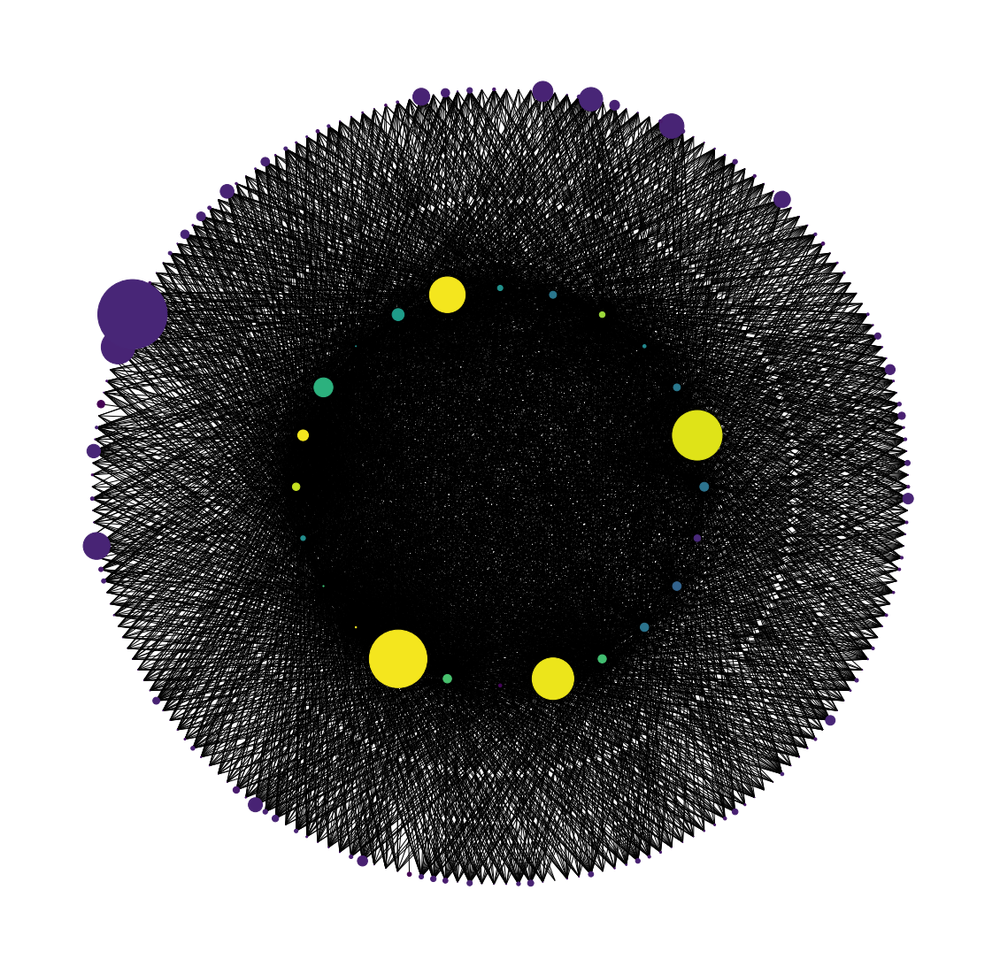

In [64]:
LaplCentr=laplacian_centrality(G, weight='weight')
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LaplCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LaplCentr, key=LaplCentr.get, reverse=True)[:5]

In [66]:
lapl_series=pd.Series(LaplCentr)
LaplCentrNx=lapl_series.to_frame(name="nx_lapl_centr")
LaplCentrNx.sort_values(by="nx_lapl_centr", ascending=False)

,nx_lapl_centr
USA,6.139032e-01
1.A.1.a,4.235487e-01
1.A.2,3.140821e-01
1.A.4,2.209925e-01
1.A.3.b_noRES,1.628803e-01
...,...
MDV,3.845430e-07
SHN,1.465909e-07
AIA,1.260906e-07
GRL,1.164856e-08


In [70]:
LaplCentrNx.to_csv('../1972_csv/laplCentr1972.csv')

# Simrank

In [53]:
bottom_nodes, top_nodes = bipartite.sets(G)
country_graph = bipartite.projected_graph(G, bottom_nodes)
industry_graph = bipartite.projected_graph(G, top_nodes)            #?

In [123]:
sr72= nx.simrank_similarity(country_graph)
sr72Data = pd.DataFrame(data=sr72)
sr72Data.head()

,GNQ,CUB,MAC,LBR,GIB,DEU,VGB,UZB,IDN,GMB,...,LSO,DOM,KHM,SEA,SHN,PRT,BHR,ITA,KNA,ARE
GNQ,1.000000,0.040432,0.040412,0.040432,0.040452,0.040412,0.040432,0.040432,0.040412,0.040432,...,0.040432,0.040452,0.040412,0.040464,0.040432,0.040412,0.040452,0.040412,0.040432,0.040452
CUB,0.040432,1.000000,0.040412,0.040412,0.040432,0.040412,0.040412,0.040412,0.040412,0.040412,...,0.040412,0.040432,0.040412,0.040391,0.040412,0.040412,0.040432,0.040412,0.040412,0.040432
MAC,0.040412,0.040412,1.000000,0.040412,0.040412,0.040413,0.040412,0.040412,0.040413,0.040412,...,0.040412,0.040412,0.040413,0.040372,0.040412,0.040413,0.040412,0.040413,0.040412,0.040412
LBR,0.040432,0.040412,0.040412,1.000000,0.040432,0.040412,0.040432,0.040432,0.040412,0.040432,...,0.040432,0.040432,0.040412,0.040444,0.040432,0.040412,0.040432,0.040412,0.040432,0.040432
GIB,0.040452,0.040432,0.040412,0.040432,1.000000,0.040412,0.040432,0.040432,0.040412,0.040432,...,0.040432,0.040452,0.040412,0.040464,0.040432,0.040412,0.040452,0.040412,0.040432,0.040452


In [119]:
sr72Data.to_csv('../1972_csv/simrank72countries.csv')

In [118]:
sr72ind= nx.simrank_similarity(industry_graph)
sr72Dataind = pd.DataFrame(data=sr72ind)
sr72Dataind.head()

,2.A.2,1.A.3.b_noRES,1.A.3.a,4.C,1.A.1.bc,2.D,3.C.1,2.A.4,3.C.3,2.A.3,...,1.A.5,1.B.1,1.A.3.c,1.A.3.e,1.A.3.d,1.A.2,2.B,3.C.2,1.B.2,2.C
2.A.2,1.000000,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,...,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717
1.A.3.b_noRES,0.271717,1.000000,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,...,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717
1.A.3.a,0.271717,0.271717,1.000000,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,...,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717
4.C,0.271717,0.271717,0.271717,1.000000,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,...,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717
1.A.1.bc,0.271717,0.271717,0.271717,0.271717,1.000000,0.271717,0.271717,0.271717,0.271717,0.271717,...,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717,0.271717


In [120]:
sr72Dataind.to_csv('../1972_csv/simrank72industries.csv')

# Eigenvector

In [72]:
eig_centrality = nx.eigenvector_centrality_numpy(G, weight='weight')

dcs_series=pd.Series(eig_centrality)
EigCentrNx=dcs_series.to_frame(name="nx_eig_centr")
EigCentrNx.sort_values(by="nx_eig_centr", ascending=False)

,nx_eig_centr
USA,6.153032e-01
1.A.1.a,4.623465e-01
1.A.2,3.336980e-01
1.A.4,2.997875e-01
1.A.3.b_noRES,2.675591e-01
...,...
BTN,7.744092e-07
AIA,2.988589e-07
SHN,2.982125e-07
GRL,3.076130e-08


In [73]:
EigCentrNx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 234 entries, ABW to ZWE
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   nx_eig_centr  234 non-null    float64
dtypes: float64(1)
memory usage: 3.7+ KB


In [74]:
EigCentrNx.to_csv('../1972_csv/EigCentr1972.csv')

['USA', '1.A.1.a', '1.A.2', '1.A.4', '1.A.3.b_noRES']

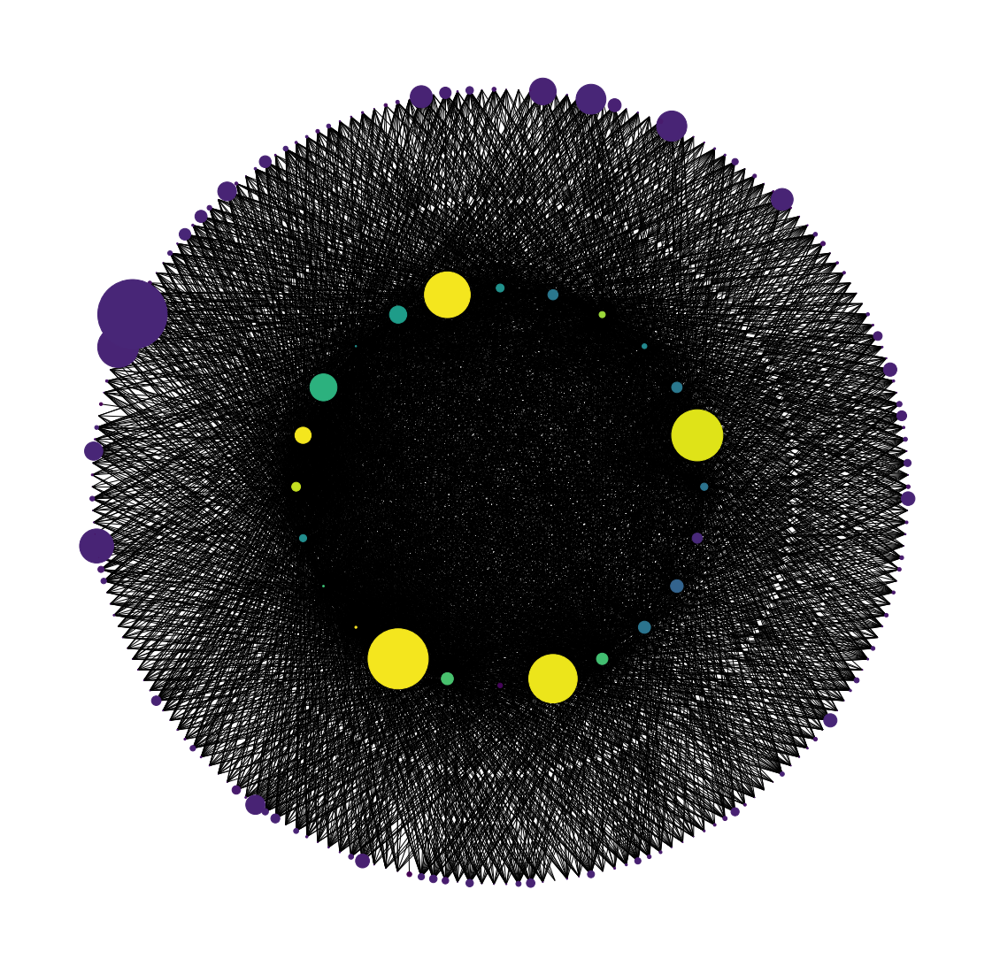

In [75]:

node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in eig_centrality.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(eig_centrality, key=eig_centrality.get, reverse=True)[:5]

In [78]:
bottom_nodes, top_nodes = bipartite.sets(G)
country_graph = bipartite.projected_graph(G, bottom_nodes)
industry_graph = bipartite.projected_graph(G, top_nodes)            #?
eig_centrality_country = nx.eigenvector_centrality_numpy(country_graph)
eig_centrality_country

{'GNQ': 0.06911447498625249,
 'CUB': 0.0692412035169137,
 'MAC': 0.06942405430677544,
 'LBR': 0.06929732577611426,
 'GIB': 0.0691144749862525,
 'DEU': 0.06942405430677544,
 'VGB': 0.06929732577611426,
 'UZB': 0.06929732577611425,
 'IDN': 0.06942405430677544,
 'GMB': 0.06929732577611425,
 'BWA': 0.06929732577611424,
 'MOZ': 0.06911447498625252,
 'STP': 0.06929732577611425,
 'SLE': 0.06929732577611424,
 'CYM': 0.06929732577611425,
 'BFA': 0.06929732577611426,
 'DJI': 0.06929732577611424,
 'GLP': 0.06929732577611422,
 'LAO': 0.06942405430677544,
 'BRA': 0.06942405430677548,
 'PRY': 0.0692412035169137,
 'MLI': 0.06929732577611425,
 'CRI': 0.06911447498625252,
 'QAT': 0.0691144749862525,
 'SCG': 0.0691144749862525,
 'BHS': 0.06929732577611425,
 'BRN': 0.06911447498625252,
 'CAF': 0.06929732577611425,
 'NPL': 0.06911447498625249,
 'PRK': 0.06911447498625249,
 'CIV': 0.0692412035169137,
 'POL': 0.0692412035169137,
 'TWN': 0.0692412035169137,
 'SWE': 0.06942405430677544,
 'DMA': 0.069297325776

# Bipartite Degree Centrality

In [79]:
bottom_nodes, top_nodes = bipartite.sets(G)
dcs = nx.bipartite.degree_centrality(G, bottom_nodes)
dcs_series=pd.Series(dcs)
BiDegCentrNx=dcs_series.to_frame(name="nx_bipartite_deg_centr")
BiDegCentrNx.sort_values(by="nx_bipartite_deg_centr", ascending=False)

,nx_bipartite_deg_centr
2.A.3,0.990476
1.A.3.b_noRES,0.971429
2.D,0.971429
1.A.1.a,0.971429
1.A.4,0.961905
...,...
FRO,0.125000
1.A.3.e,0.119048
AIR,0.041667
SEA,0.041667


In [80]:
BiDegCentrNx.to_csv("../1972_csv/degree_centr_nx1972.csv")

# bipartite betweeness

In [81]:
beetw = nx.bipartite.betweenness_centrality(G, bottom_nodes)
bet_series=pd.Series(beetw)
BetwCentrNx=bet_series.to_frame(name="nx_bipartite_betw_centr")
BetwCentrNx.sort_values(by="nx_bipartite_betw_centr", ascending=False)

,nx_bipartite_betw_centr
2.A.3,0.090629
2.D,0.081974
1.A.1.a,0.080921
1.A.3.b_noRES,0.080615
1.A.4,0.079581
...,...
FRO,0.000009
GRL,0.000009
GNQ,0.000008
AIR,0.000000


# bipartite closeness

In [82]:
close = nx.bipartite.closeness_centrality(G, bottom_nodes)
cl_series=pd.Series(close)
CloseCentrNx=cl_series.to_frame(name="nx_bipartite_closen_centr")
CloseCentrNx.sort_values(by="nx_bipartite_closen_centr", ascending=False)

,nx_bipartite_closen_centr
ITA,0.995495
ESP,0.995495
AUS,0.995495
JPN,0.995495
USA,0.995495
...,...
1.B.1,0.498054
1.A.3.d,0.496124
1.A.3.c,0.470588
1.A.3.e,0.408946


In [83]:
CloseCentrNx.to_csv("../1972_csv/closeness_nx1972.csv")

## Byrank measures

In [84]:
%pip install birankpy

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


### Cleaning of the data
filter dataframe, select only interested columns and rows

In [85]:
df72_filtered= df72.filter(['ipcc_code_2006_for_standard_report','Country_code_A3', 'Y_1972'])

In [86]:
noNa=df72_filtered.dropna()
noNa

,ipcc_code_2006_for_standard_report,Country_code_A3,Y_1972
0,1.A.1.a,ABW,0.021451
1,1.A.2,ABW,9.504931
2,1.A.4,ABW,0.848604
3,1.A.5,ABW,0.057359
5,1.A.1.a,ABW,34.176170
...,...,...,...
4766,2.A.1,ZWE,305.488000
4767,2.A.3,ZWE,0.278666
4769,2.B,ZWE,148.155000
4770,2.C,ZWE,1204.285510


In [87]:
import birankpy
bn = birankpy.BipartiteNetwork()

bn.set_edgelist(noNa,  top_col='ipcc_code_2006_for_standard_report', bottom_col='Country_code_A3', weight_col='Y_1972')


### Hits

In [88]:
HITSdf, _ = bn.generate_birank(normalizer='HITS')
HITSdf.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
0,1.A.1.a,0.244840
1,1.A.2,0.220800
2,1.A.4,0.211073
5,1.A.3.b_noRES,0.141228
16,1.A.1.bc,0.049012


In [89]:
HITSdf.to_csv('../1972_csv/HITSdf1972.csv')

### CoHITS

In [90]:
coHITS_df, _ = bn.generate_birank(normalizer='CoHITS')
coHITS_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
2,1.A.4,0.205517
1,1.A.2,0.200116
0,1.A.1.a,0.169490
5,1.A.3.b_noRES,0.082813
3,1.A.5,0.034807


In [91]:
coHITS_df.to_csv('../1972_csv/coHITSdf1972.csv')

In [92]:
br_df, _ = bn.generate_birank(normalizer='BiRank')
br_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
1,1.A.2,0.043335
2,1.A.4,0.043217
0,1.A.1.a,0.040776
5,1.A.3.b_noRES,0.029478
10,1.A.3.d,0.021635


In [93]:
br_df.to_csv('../1972_csv/birank_df1972.csv')

In [94]:
bgrm_df, _ = bn.generate_birank(normalizer='BGRM')
bgrm_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
19,4.C,0.00625
3,1.A.5,0.00625
6,1.B.2,0.00625
9,3.C.1,0.00625
12,2.A.1,0.00625


### Unipartite projection

In [95]:
un = bn.unipartite_projection(on='ipcc_code_2006_for_standard_report_birank')
industry_projected_pagerank_df = un.generate_pagerank()
industry_projected_pagerank_df.sort_values(by='pagerank', ascending=False).head()

,ipcc_code_2006_for_standard_report,pagerank
0,1.A.1.a,0.199038
1,1.A.2,0.188620
2,1.A.4,0.174025
5,1.A.3.b_noRES,0.129013
16,1.A.1.bc,0.054068


### Countries

In [97]:
import birankpy
countryfirst_bn = birankpy.BipartiteNetwork()

countryfirst_bn.set_edgelist(noNa, top_col='Country_code_A3', bottom_col='ipcc_code_2006_for_standard_report',  weight_col='Y_1972')


In [98]:
HITSdf, _ = countryfirst_bn.generate_birank(normalizer='HITS')
HITSdf.sort_values(by='Country_code_A3_birank', ascending=False).head()

,Country_code_A3,Country_code_A3_birank
198,USA,0.259467
36,CHN,0.094091
160,RUS,0.086865
50,DEU,0.060701
99,JPN,0.046367


In [99]:
coHITSdf, _ = countryfirst_bn.generate_birank(normalizer='CoHITS')
coHITSdf.sort_values(by='Country_code_A3_birank', ascending=False).head()

,Country_code_A3,Country_code_A3_birank
198,USA,0.200109
160,RUS,0.071169
36,CHN,0.070729
50,DEU,0.044761
99,JPN,0.040964


### Unipartite Projection

In [100]:
country_un = countryfirst_bn.unipartite_projection(on='Country_code_A3')
country_projected_pagerank_df = country_un.generate_pagerank()
country_projected_pagerank_df.sort_values(by='pagerank', ascending=False).head()

,Country_code_A3,pagerank
198,USA,0.176746
36,CHN,0.084429
160,RUS,0.070054
50,DEU,0.052855
99,JPN,0.040924


Usa results more central than China in 1972 emissions

# Eigenvector ? 
maybe on the unipartite projection

# comparing  centrality measures
 CREARE TABELLA! con rows= nodi e columns = different measures 

# use Unipartite projection for clustering coefficient? 
for grouping the countries

# small world?

# Degree distribution?
Check if it corresponds to one of the ones in lecture 6

# cohesion e connectedness?

# proj matrix

# From Graph to matrix

In [78]:
import numpy as np
%pip install scipy
from scipy.sparse import csr_matrix

# from graph to matrix
m = nx.adjacency_matrix( G ).A # the ndarray version of the matrix

# transpose
m_t = m.transpose()

# generic matrix combination operation
def combine( m1, m2, op ):
    assert( np.shape( m1 ) == np.shape( m2 ) )
    dim = np.shape( m1 )
    if ( len( dim ) == 1 ):
        res = np.array( m1 )
        for i in range( 0, dim[ 0 ] ):
            res[ i ] = op( m1[ i ], m2[ i ] )
        return res
    else:
        res = np.array( m1 )
        for i in range( 0, dim[ len( dim ) - 1 ] ):
            res[ i ] = combine( m1[ i ], m2[ i ], op )
        return res
    
SYM_UNION = (lambda x, y: x | y)     # OR
SYM_INTERSECT = (lambda x, y: x & y) # AND

# symmetrisation (via transpose)
sym_uni = combine( m, m_t, SYM_UNION )
sym_int = combine( m, m_t, SYM_INTERSECT )
#print( np.matrix( sym_uni ) )
#print( np.matrix( sym_int ) )

g_uni = nx.from_numpy_matrix( sym_uni, create_using=nx.DiGraph )
#nx.draw_networkx( g_uni )
g_int = nx.from_numpy_matrix( sym_int, create_using=nx.DiGraph )
#nx.draw_networkx( g_int )

m_sum = combine( m, m_t, (lambda x, y: x + y ) )

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement scipy.sparse (from versions: none)
ERROR: No matching distribution found for scipy.sparse
You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


TypeError: ufunc 'bitwise_or' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

# Analysis
approfondire:
- Modularity
- Eccentricity

connected components

In [15]:
components = nx.connected_components(weight_proj_coll)
sorted_components = sorted(components, key=len, reverse=True)
components_sets = [len(c) for c in sorted_components]
print(components_sets)

[210]


In [21]:
len(sorted_components)

1

In [17]:
subgraph = weight_proj_coll.subgraph(sorted_components[0])
clustering = nx.average_clustering(subgraph) 
print(clustering)

0.9953891169852257


In [18]:
from networkx.algorithms import community


# Calculate modularity
partition = community.greedy_modularity_communities(G)
modularity = community.modularity(G, partition)

print("Modularity:", modularity)

Modularity: -0.23431022744097246


In [102]:
nx.community.modularity(G, [top_nodes,bottom_nodes], weight='weight')

-0.49999999999999944

In [103]:
nx.community.modularity(country_graph, nx.community.label_propagation_communities(country_graph))

0.0

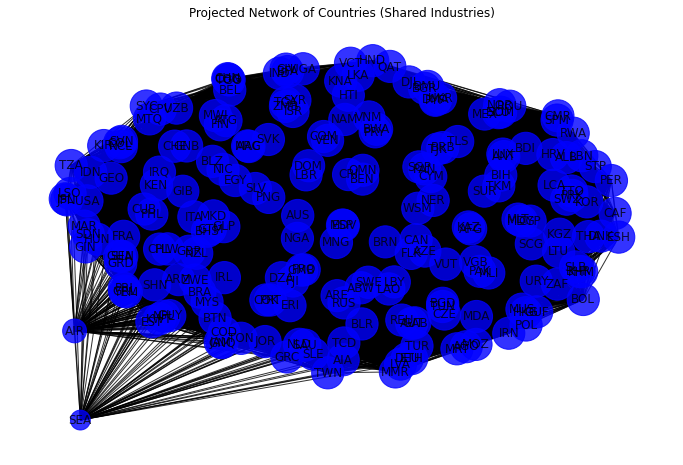

In [109]:
# Project bipartite graph onto the set of countries
countries_proj = bipartite.projected_graph(G, bottom_nodes, multigraph=False)

# Calculate node sizes and positions for the projected graph
pos_proj = nx.spring_layout(countries_proj, seed=42)
node_size_proj = [v * 5 for v in dict(countries_proj.degree()).values()]

# Color of nodes in the projected graph (you can choose a color)
node_colors_proj = "blue"

# Create the plot for the projected graph
plt.figure(figsize=(12, 8))
nx.draw_networkx(
    countries_proj,
    pos_proj,
    node_size=node_size_proj,
    node_color=node_colors_proj,
    with_labels=True,
    alpha=0.8,
)
plt.title("Projected Network of Countries (Shared Industries)")
plt.axis("off")
plt.show()


Country: GNQ, Degree Centrality: 0.990
Country: CUB, Degree Centrality: 0.995
Country: MAC, Degree Centrality: 1.000
Country: LBR, Degree Centrality: 0.995
Country: GIB, Degree Centrality: 0.990
Country: DEU, Degree Centrality: 1.000
Country: VGB, Degree Centrality: 0.995
Country: UZB, Degree Centrality: 0.995
Country: IDN, Degree Centrality: 1.000
Country: GMB, Degree Centrality: 0.995
Country: BWA, Degree Centrality: 0.995
Country: MOZ, Degree Centrality: 0.990
Country: STP, Degree Centrality: 0.995
Country: SLE, Degree Centrality: 0.995
Country: CYM, Degree Centrality: 0.995
Country: BFA, Degree Centrality: 0.995
Country: DJI, Degree Centrality: 0.995
Country: GLP, Degree Centrality: 0.995
Country: LAO, Degree Centrality: 1.000
Country: BRA, Degree Centrality: 1.000
Country: PRY, Degree Centrality: 0.995
Country: MLI, Degree Centrality: 0.995
Country: CRI, Degree Centrality: 0.990
Country: QAT, Degree Centrality: 0.990
Country: SCG, Degree Centrality: 0.990
Country: BHS, Degree Cent

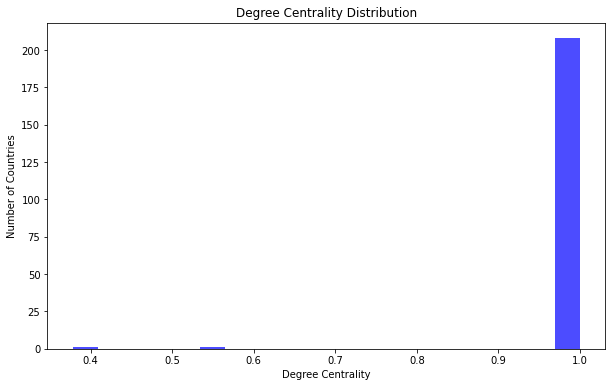

In [110]:
# Calculate degree centrality for the projected graph
degree_centrality = nx.degree_centrality(countries_proj)

# Extract the degree centrality values for each country
country_degrees = {country: centrality for country, centrality in degree_centrality.items()}

# Print the degree centrality for each country
for country, centrality in country_degrees.items():
    print(f"Country: {country}, Degree Centrality: {centrality:.3f}")

# Visualize the degree centrality distribution
plt.figure(figsize=(10, 6))
plt.hist(country_degrees.values(), bins=20, color="blue", alpha=0.7)
plt.xlabel("Degree Centrality")
plt.ylabel("Number of Countries")
plt.title("Degree Centrality Distribution")
plt.show()